Code for **super-resolution** (figures $1$ and $5$ from main paper).. Change `factor` to $8$ to reproduce images from fig. $9$ from supmat.

You can play with parameters and see how they affect the result. 

In [1]:
"""
*Uncomment if running on colab* 
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab 
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 289, done.
remote: Total 289 (delta 0), reused 0 (delta 0), pack-reused 289
Receiving objects: 100% (289/289), 24.28 MiB | 32.76 MiB/s, done.
Resolving deltas: 100% (155/155), done.


# Import libs

In [0]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import argparse
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.measure import compare_psnr
from models.downsampler import Downsampler

from utils.sr_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize = -1 
factor = 4 # 8
enforse_div32 = 'CROP' # we usually need the dimensions to be divisible by a power of two (32 in this case)
PLOT = True

# To produce images from the paper we took *_GT.png images from LapSRN viewer for corresponding factor,
# e.g. x4/zebra_GT.png for factor=4, and x8/zebra_GT.png for factor=8 
path_to_image = 'data/sr/zebra_GT.png'

# Load image and baselines

HR and LR resolutions: (576, 384), (144, 96)


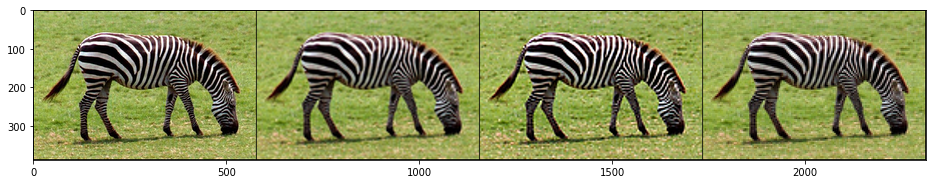

PSNR bicubic: 23.1048   PSNR nearest: 20.8212


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  # Remove the CWD from sys.path while we load stuff.


In [3]:
# Starts here
imgs = load_LR_HR_imgs_sr(path_to_image , imsize, factor, enforse_div32)

imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np'] = get_baselines(imgs['LR_pil'], imgs['HR_pil'])

if PLOT:
    plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], imgs['sharp_np'], imgs['nearest_np']], 4,12);
    print ('PSNR bicubic: %.4f   PSNR nearest: %.4f' %  (
                                        compare_psnr(imgs['HR_np'], imgs['bicubic_np']), 
                                        compare_psnr(imgs['HR_np'], imgs['nearest_np'])))

# Set up parameters and net

In [0]:
input_depth = 32
 
INPUT =     'noise'
pad   =     'reflection'
OPT_OVER =  'net'
KERNEL_TYPE='lanczos2'

LR = 0.01
tv_weight = 0.0

OPTIMIZER = 'adam'

if factor == 4: 
    num_iter = 2000
    reg_noise_std = 0.03
elif factor == 8:
    num_iter = 4000
    reg_noise_std = 0.05
else:
    assert False, 'We did not experiment with other factors'

In [0]:
net_input = get_noise(input_depth, INPUT, (imgs['HR_pil'].size[1], imgs['HR_pil'].size[0])).type(dtype).detach()

NET_TYPE = 'skip' # UNet, ResNet
net = get_net(input_depth, 'skip', pad,
              skip_n33d=128, 
              skip_n33u=128, 
              skip_n11=4, 
              num_scales=5,
              upsample_mode='bilinear').type(dtype)

# Losses
mse = torch.nn.MSELoss().type(dtype)

img_LR_var = np_to_torch(imgs['LR_np']).type(dtype)

downsampler = Downsampler(n_planes=3, factor=factor, kernel_type=KERNEL_TYPE, phase=0.5, preserve_size=True).type(dtype)

# Define closure and optimize

In [0]:
def closure():
    global i, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out_HR = net(net_input)
    out_LR = downsampler(out_HR)

    total_loss = mse(out_LR, img_LR_var) 
    
    if tv_weight > 0:
        total_loss += tv_weight * tv_loss(out_HR)
        
    total_loss.backward()

    # Log
    psnr_LR = compare_psnr(imgs['LR_np'], torch_to_np(out_LR))
    psnr_HR = compare_psnr(imgs['HR_np'], torch_to_np(out_HR))
    print ('Iteration %05d    PSNR_LR %.3f   PSNR_HR %.3f' % (i, psnr_LR, psnr_HR), sep='\r', end='')
                      
    # History
    psnr_history.append([psnr_LR, psnr_HR])
    
    if PLOT and i % 100 == 0:
        out_HR_np = torch_to_np(out_HR)
        plot_image_grid([imgs['HR_np'], imgs['bicubic_np'], np.clip(out_HR_np, 0, 1)], factor=13, nrow=3)

    i += 1
    
    return total_loss

Starting optimization with ADAM
Iteration 00000    PSNR_LR 19.824   PSNR_HR 18.041

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2973: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


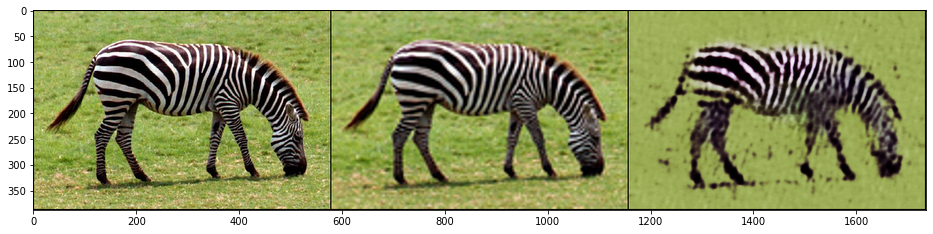

Iteration 00001    PSNR_LR 13.069   PSNR_HR 12.590Iteration 00002    PSNR_LR 14.618   PSNR_HR 13.952Iteration 00003    PSNR_LR 16.158   PSNR_HR 15.263Iteration 00004    PSNR_LR 16.605   PSNR_HR 15.604Iteration 00005    PSNR_LR 16.954   PSNR_HR 15.883Iteration 00006    PSNR_LR 17.611   PSNR_HR 16.415Iteration 00007    PSNR_LR 18.171   PSNR_HR 16.858Iteration 00008    PSNR_LR 18.625   PSNR_HR 17.224Iteration 00009    PSNR_LR 18.976   PSNR_HR 17.482Iteration 00010    PSNR_LR 19.443   PSNR_HR 17.822Iteration 00011    PSNR_LR 19.717   PSNR_HR 17.993Iteration 00012    PSNR_LR 20.003   PSNR_HR 18.211Iteration 00013    PSNR_LR 20.242   PSNR_HR 18.366Iteration 00014    PSNR_LR 20.434   PSNR_HR 18.490Iteration 00015    PSNR_LR 20.522   PSNR_HR 18.539Iteration 00016    PSNR_LR 20.946   PSNR_HR 18.818Iteration 00017    PSNR_LR 21.087   PSNR_HR 18.907Iteration 00018    PSNR_LR 20.998   PSNR_HR 18.882Iteration 00019    PSNR_LR 21.360   PSNR_HR 19.088Iteration 00020    PSNR_LR 21.543   PSNR_HR 19.181

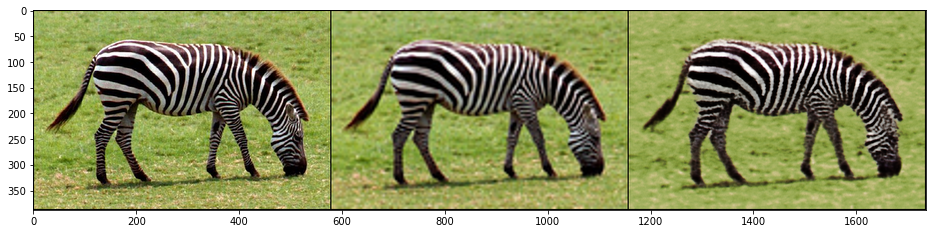

Iteration 00101    PSNR_LR 27.072   PSNR_HR 22.156Iteration 00102    PSNR_LR 27.167   PSNR_HR 22.229Iteration 00103    PSNR_LR 27.035   PSNR_HR 22.149Iteration 00104    PSNR_LR 27.199   PSNR_HR 22.183Iteration 00105    PSNR_LR 27.086   PSNR_HR 22.116Iteration 00106    PSNR_LR 27.344   PSNR_HR 22.206Iteration 00107    PSNR_LR 27.210   PSNR_HR 22.135Iteration 00108    PSNR_LR 27.341   PSNR_HR 22.236Iteration 00109    PSNR_LR 27.254   PSNR_HR 22.260Iteration 00110    PSNR_LR 27.259   PSNR_HR 22.224Iteration 00111    PSNR_LR 27.408   PSNR_HR 22.261Iteration 00112    PSNR_LR 27.379   PSNR_HR 22.279Iteration 00113    PSNR_LR 27.373   PSNR_HR 22.283Iteration 00114    PSNR_LR 27.376   PSNR_HR 22.254Iteration 00115    PSNR_LR 27.229   PSNR_HR 22.211Iteration 00116    PSNR_LR 27.614   PSNR_HR 22.351Iteration 00117    PSNR_LR 27.342   PSNR_HR 22.231Iteration 00118    PSNR_LR 27.537   PSNR_HR 22.348Iteration 00119    PSNR_LR 27.546   PSNR_HR 22.364Iteration 00120    PSNR_LR 27.567   PSNR_HR 22.331

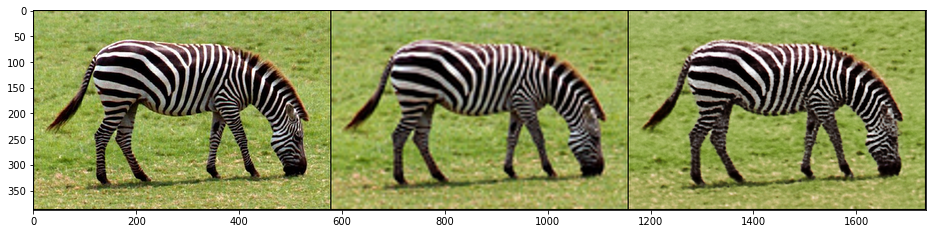

Iteration 00201    PSNR_LR 29.661   PSNR_HR 23.044Iteration 00202    PSNR_LR 29.779   PSNR_HR 23.022Iteration 00203    PSNR_LR 29.851   PSNR_HR 23.066Iteration 00204    PSNR_LR 29.779   PSNR_HR 23.063Iteration 00205    PSNR_LR 29.719   PSNR_HR 22.976Iteration 00206    PSNR_LR 29.710   PSNR_HR 22.998Iteration 00207    PSNR_LR 30.046   PSNR_HR 23.105Iteration 00208    PSNR_LR 29.877   PSNR_HR 23.031Iteration 00209    PSNR_LR 29.996   PSNR_HR 23.073Iteration 00210    PSNR_LR 30.075   PSNR_HR 23.095Iteration 00211    PSNR_LR 29.895   PSNR_HR 23.032Iteration 00212    PSNR_LR 30.040   PSNR_HR 23.117Iteration 00213    PSNR_LR 30.104   PSNR_HR 23.090Iteration 00214    PSNR_LR 30.028   PSNR_HR 23.044Iteration 00215    PSNR_LR 30.087   PSNR_HR 23.162Iteration 00216    PSNR_LR 30.162   PSNR_HR 23.095Iteration 00217    PSNR_LR 30.102   PSNR_HR 23.079Iteration 00218    PSNR_LR 29.997   PSNR_HR 23.128Iteration 00219    PSNR_LR 30.181   PSNR_HR 23.088Iteration 00220    PSNR_LR 30.229   PSNR_HR 23.131

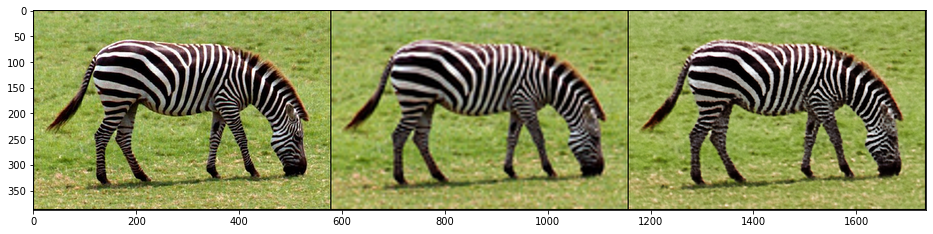

Iteration 00301    PSNR_LR 31.193   PSNR_HR 23.409Iteration 00302    PSNR_LR 31.421   PSNR_HR 23.421Iteration 00303    PSNR_LR 31.538   PSNR_HR 23.379Iteration 00304    PSNR_LR 31.157   PSNR_HR 23.394Iteration 00305    PSNR_LR 31.396   PSNR_HR 23.381Iteration 00306    PSNR_LR 31.494   PSNR_HR 23.398Iteration 00307    PSNR_LR 31.093   PSNR_HR 23.365Iteration 00308    PSNR_LR 31.596   PSNR_HR 23.441Iteration 00309    PSNR_LR 31.589   PSNR_HR 23.467Iteration 00310    PSNR_LR 31.571   PSNR_HR 23.412Iteration 00311    PSNR_LR 31.697   PSNR_HR 23.444Iteration 00312    PSNR_LR 31.448   PSNR_HR 23.355Iteration 00313    PSNR_LR 31.503   PSNR_HR 23.456Iteration 00314    PSNR_LR 31.430   PSNR_HR 23.440Iteration 00315    PSNR_LR 31.445   PSNR_HR 23.437Iteration 00316    PSNR_LR 31.755   PSNR_HR 23.507Iteration 00317    PSNR_LR 31.298   PSNR_HR 23.391Iteration 00318    PSNR_LR 31.447   PSNR_HR 23.403Iteration 00319    PSNR_LR 31.786   PSNR_HR 23.449Iteration 00320    PSNR_LR 31.378   PSNR_HR 23.395

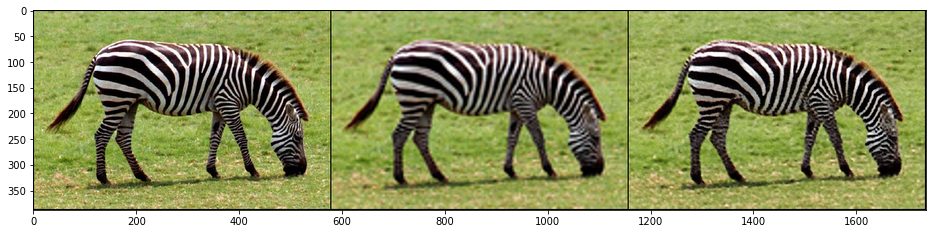

Iteration 00401    PSNR_LR 32.728   PSNR_HR 23.639Iteration 00402    PSNR_LR 32.441   PSNR_HR 23.630Iteration 00403    PSNR_LR 32.382   PSNR_HR 23.538Iteration 00404    PSNR_LR 32.622   PSNR_HR 23.628Iteration 00405    PSNR_LR 32.775   PSNR_HR 23.628Iteration 00406    PSNR_LR 32.554   PSNR_HR 23.566Iteration 00407    PSNR_LR 32.576   PSNR_HR 23.608Iteration 00408    PSNR_LR 32.690   PSNR_HR 23.598Iteration 00409    PSNR_LR 32.710   PSNR_HR 23.633Iteration 00410    PSNR_LR 32.644   PSNR_HR 23.623Iteration 00411    PSNR_LR 32.754   PSNR_HR 23.634Iteration 00412    PSNR_LR 32.619   PSNR_HR 23.618Iteration 00413    PSNR_LR 32.638   PSNR_HR 23.656Iteration 00414    PSNR_LR 32.799   PSNR_HR 23.630Iteration 00415    PSNR_LR 32.627   PSNR_HR 23.626Iteration 00416    PSNR_LR 32.754   PSNR_HR 23.664Iteration 00417    PSNR_LR 32.767   PSNR_HR 23.625Iteration 00418    PSNR_LR 32.934   PSNR_HR 23.661Iteration 00419    PSNR_LR 32.918   PSNR_HR 23.719Iteration 00420    PSNR_LR 32.688   PSNR_HR 23.646

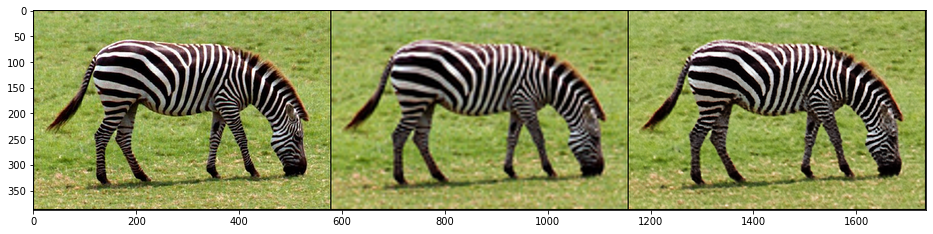

Iteration 00501    PSNR_LR 33.491   PSNR_HR 23.713Iteration 00502    PSNR_LR 33.371   PSNR_HR 23.706Iteration 00503    PSNR_LR 33.524   PSNR_HR 23.758Iteration 00504    PSNR_LR 33.481   PSNR_HR 23.738Iteration 00505    PSNR_LR 33.306   PSNR_HR 23.692Iteration 00506    PSNR_LR 33.451   PSNR_HR 23.783Iteration 00507    PSNR_LR 33.588   PSNR_HR 23.773Iteration 00508    PSNR_LR 33.401   PSNR_HR 23.701Iteration 00509    PSNR_LR 33.618   PSNR_HR 23.787Iteration 00510    PSNR_LR 33.400   PSNR_HR 23.734Iteration 00511    PSNR_LR 33.462   PSNR_HR 23.686Iteration 00512    PSNR_LR 33.736   PSNR_HR 23.755Iteration 00513    PSNR_LR 33.436   PSNR_HR 23.684Iteration 00514    PSNR_LR 33.340   PSNR_HR 23.739Iteration 00515    PSNR_LR 33.678   PSNR_HR 23.770Iteration 00516    PSNR_LR 33.489   PSNR_HR 23.752Iteration 00517    PSNR_LR 33.552   PSNR_HR 23.746Iteration 00518    PSNR_LR 33.477   PSNR_HR 23.685Iteration 00519    PSNR_LR 33.347   PSNR_HR 23.731Iteration 00520    PSNR_LR 33.604   PSNR_HR 23.712

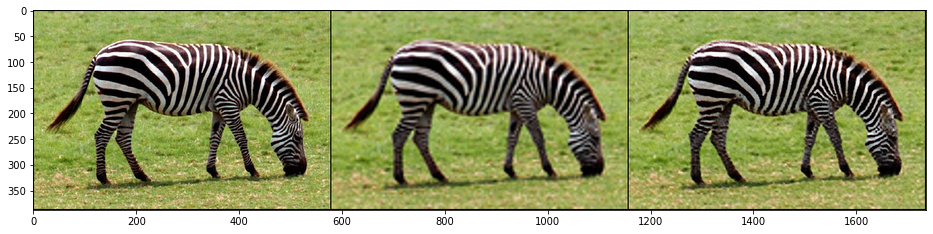

Iteration 00601    PSNR_LR 34.043   PSNR_HR 23.836Iteration 00602    PSNR_LR 33.793   PSNR_HR 23.772Iteration 00603    PSNR_LR 33.991   PSNR_HR 23.865Iteration 00604    PSNR_LR 34.247   PSNR_HR 23.830Iteration 00605    PSNR_LR 33.931   PSNR_HR 23.731Iteration 00606    PSNR_LR 33.900   PSNR_HR 23.867Iteration 00607    PSNR_LR 34.454   PSNR_HR 23.842Iteration 00608    PSNR_LR 34.164   PSNR_HR 23.829Iteration 00609    PSNR_LR 33.836   PSNR_HR 23.887Iteration 00610    PSNR_LR 34.038   PSNR_HR 23.812Iteration 00611    PSNR_LR 34.405   PSNR_HR 23.835Iteration 00612    PSNR_LR 34.062   PSNR_HR 23.835Iteration 00613    PSNR_LR 33.989   PSNR_HR 23.767Iteration 00614    PSNR_LR 34.262   PSNR_HR 23.803Iteration 00615    PSNR_LR 34.290   PSNR_HR 23.884Iteration 00616    PSNR_LR 34.348   PSNR_HR 23.850Iteration 00617    PSNR_LR 34.282   PSNR_HR 23.830Iteration 00618    PSNR_LR 34.152   PSNR_HR 23.848Iteration 00619    PSNR_LR 34.358   PSNR_HR 23.824Iteration 00620    PSNR_LR 34.339   PSNR_HR 23.823

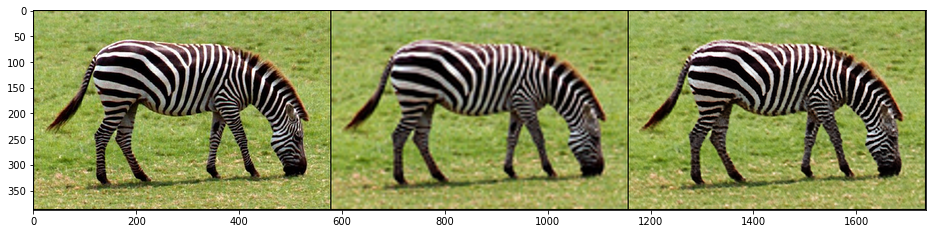

Iteration 00701    PSNR_LR 34.979   PSNR_HR 23.890Iteration 00702    PSNR_LR 34.945   PSNR_HR 23.909Iteration 00703    PSNR_LR 34.869   PSNR_HR 23.918Iteration 00704    PSNR_LR 35.015   PSNR_HR 23.952Iteration 00705    PSNR_LR 34.790   PSNR_HR 23.849Iteration 00706    PSNR_LR 34.980   PSNR_HR 23.911Iteration 00707    PSNR_LR 34.817   PSNR_HR 23.885Iteration 00708    PSNR_LR 34.657   PSNR_HR 23.864Iteration 00709    PSNR_LR 34.813   PSNR_HR 23.921Iteration 00710    PSNR_LR 34.766   PSNR_HR 23.887Iteration 00711    PSNR_LR 34.874   PSNR_HR 23.946Iteration 00712    PSNR_LR 34.625   PSNR_HR 23.890Iteration 00713    PSNR_LR 34.699   PSNR_HR 23.854Iteration 00714    PSNR_LR 34.867   PSNR_HR 23.888Iteration 00715    PSNR_LR 34.950   PSNR_HR 23.874Iteration 00716    PSNR_LR 34.711   PSNR_HR 23.832Iteration 00717    PSNR_LR 34.757   PSNR_HR 23.928Iteration 00718    PSNR_LR 34.928   PSNR_HR 23.884Iteration 00719    PSNR_LR 34.983   PSNR_HR 23.893Iteration 00720    PSNR_LR 34.900   PSNR_HR 23.909

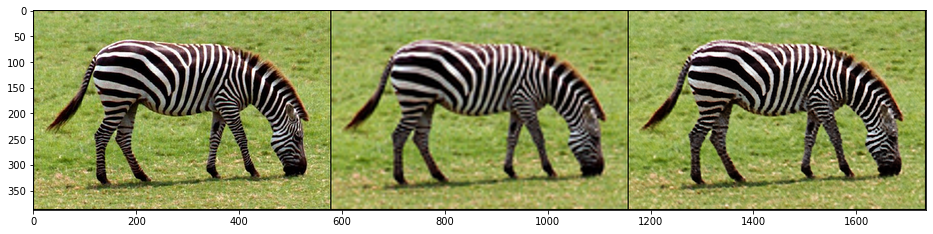

Iteration 00801    PSNR_LR 35.286   PSNR_HR 23.900Iteration 00802    PSNR_LR 35.200   PSNR_HR 23.880Iteration 00803    PSNR_LR 35.403   PSNR_HR 23.960Iteration 00804    PSNR_LR 35.422   PSNR_HR 23.961Iteration 00805    PSNR_LR 35.311   PSNR_HR 23.931Iteration 00806    PSNR_LR 35.313   PSNR_HR 23.990Iteration 00807    PSNR_LR 35.405   PSNR_HR 23.954Iteration 00808    PSNR_LR 35.228   PSNR_HR 23.955Iteration 00809    PSNR_LR 35.018   PSNR_HR 23.947Iteration 00810    PSNR_LR 34.901   PSNR_HR 23.856Iteration 00811    PSNR_LR 35.036   PSNR_HR 23.985Iteration 00812    PSNR_LR 35.403   PSNR_HR 23.965Iteration 00813    PSNR_LR 35.131   PSNR_HR 23.884Iteration 00814    PSNR_LR 34.935   PSNR_HR 23.979Iteration 00815    PSNR_LR 35.248   PSNR_HR 23.941Iteration 00816    PSNR_LR 35.383   PSNR_HR 23.975Iteration 00817    PSNR_LR 34.979   PSNR_HR 23.991Iteration 00818    PSNR_LR 34.762   PSNR_HR 23.859Iteration 00819    PSNR_LR 35.130   PSNR_HR 23.992Iteration 00820    PSNR_LR 35.611   PSNR_HR 23.959

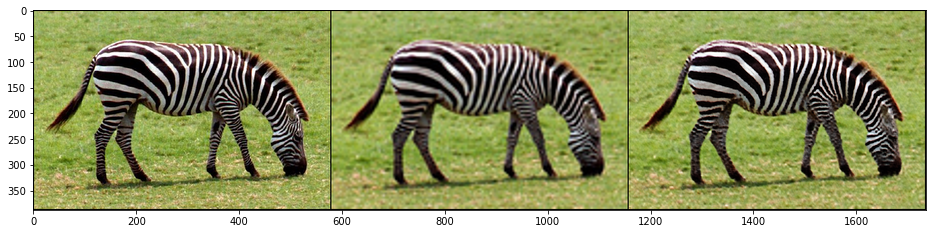

Iteration 00901    PSNR_LR 35.755   PSNR_HR 24.009Iteration 00902    PSNR_LR 35.633   PSNR_HR 24.033Iteration 00903    PSNR_LR 35.704   PSNR_HR 23.982Iteration 00904    PSNR_LR 35.717   PSNR_HR 23.997Iteration 00905    PSNR_LR 35.773   PSNR_HR 24.015Iteration 00906    PSNR_LR 35.928   PSNR_HR 23.966Iteration 00907    PSNR_LR 35.886   PSNR_HR 24.036Iteration 00908    PSNR_LR 35.986   PSNR_HR 24.043Iteration 00909    PSNR_LR 35.887   PSNR_HR 24.010Iteration 00910    PSNR_LR 35.816   PSNR_HR 24.060Iteration 00911    PSNR_LR 35.611   PSNR_HR 23.971Iteration 00912    PSNR_LR 35.896   PSNR_HR 24.021Iteration 00913    PSNR_LR 35.979   PSNR_HR 24.029Iteration 00914    PSNR_LR 35.826   PSNR_HR 24.008Iteration 00915    PSNR_LR 35.830   PSNR_HR 24.067Iteration 00916    PSNR_LR 35.833   PSNR_HR 23.958Iteration 00917    PSNR_LR 35.976   PSNR_HR 23.982Iteration 00918    PSNR_LR 35.883   PSNR_HR 23.985Iteration 00919    PSNR_LR 35.838   PSNR_HR 24.006Iteration 00920    PSNR_LR 35.980   PSNR_HR 24.046

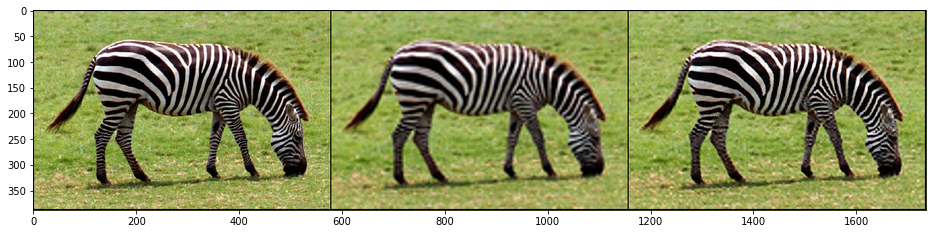

Iteration 01001    PSNR_LR 36.318   PSNR_HR 24.031Iteration 01002    PSNR_LR 36.292   PSNR_HR 24.036Iteration 01003    PSNR_LR 36.034   PSNR_HR 24.071Iteration 01004    PSNR_LR 36.332   PSNR_HR 24.013Iteration 01005    PSNR_LR 36.076   PSNR_HR 24.045Iteration 01006    PSNR_LR 36.230   PSNR_HR 24.070Iteration 01007    PSNR_LR 36.181   PSNR_HR 24.036Iteration 01008    PSNR_LR 36.329   PSNR_HR 24.037Iteration 01009    PSNR_LR 35.993   PSNR_HR 24.042Iteration 01010    PSNR_LR 36.061   PSNR_HR 24.048Iteration 01011    PSNR_LR 36.287   PSNR_HR 24.055Iteration 01012    PSNR_LR 36.204   PSNR_HR 24.009Iteration 01013    PSNR_LR 36.152   PSNR_HR 24.064Iteration 01014    PSNR_LR 36.482   PSNR_HR 24.068Iteration 01015    PSNR_LR 36.382   PSNR_HR 24.058Iteration 01016    PSNR_LR 35.939   PSNR_HR 24.083Iteration 01017    PSNR_LR 35.909   PSNR_HR 24.010Iteration 01018    PSNR_LR 36.047   PSNR_HR 24.026Iteration 01019    PSNR_LR 36.315   PSNR_HR 24.093Iteration 01020    PSNR_LR 35.719   PSNR_HR 24.011

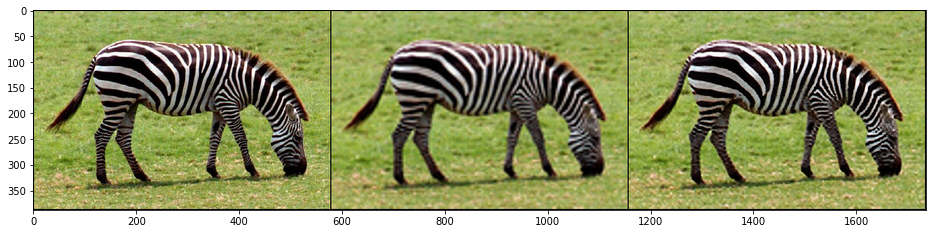

Iteration 01101    PSNR_LR 36.636   PSNR_HR 24.143Iteration 01102    PSNR_LR 36.568   PSNR_HR 24.071Iteration 01103    PSNR_LR 36.625   PSNR_HR 24.061Iteration 01104    PSNR_LR 36.586   PSNR_HR 24.090Iteration 01105    PSNR_LR 36.565   PSNR_HR 24.075Iteration 01106    PSNR_LR 36.697   PSNR_HR 24.075Iteration 01107    PSNR_LR 36.522   PSNR_HR 24.070Iteration 01108    PSNR_LR 36.402   PSNR_HR 24.103Iteration 01109    PSNR_LR 36.489   PSNR_HR 24.100Iteration 01110    PSNR_LR 36.666   PSNR_HR 24.102Iteration 01111    PSNR_LR 36.646   PSNR_HR 24.070Iteration 01112    PSNR_LR 36.760   PSNR_HR 24.092Iteration 01113    PSNR_LR 36.647   PSNR_HR 24.106Iteration 01114    PSNR_LR 36.530   PSNR_HR 24.063Iteration 01115    PSNR_LR 36.666   PSNR_HR 24.106Iteration 01116    PSNR_LR 36.586   PSNR_HR 24.064Iteration 01117    PSNR_LR 36.637   PSNR_HR 24.086Iteration 01118    PSNR_LR 36.346   PSNR_HR 24.062Iteration 01119    PSNR_LR 36.506   PSNR_HR 24.060Iteration 01120    PSNR_LR 36.855   PSNR_HR 24.092

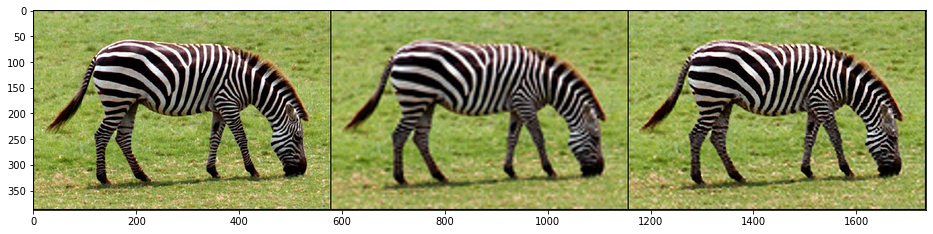

Iteration 01201    PSNR_LR 37.035   PSNR_HR 24.094Iteration 01202    PSNR_LR 36.832   PSNR_HR 24.058Iteration 01203    PSNR_LR 36.791   PSNR_HR 24.129Iteration 01204    PSNR_LR 37.068   PSNR_HR 24.109Iteration 01205    PSNR_LR 37.041   PSNR_HR 24.161Iteration 01206    PSNR_LR 37.160   PSNR_HR 24.180Iteration 01207    PSNR_LR 37.048   PSNR_HR 24.142Iteration 01208    PSNR_LR 36.949   PSNR_HR 24.122Iteration 01209    PSNR_LR 37.076   PSNR_HR 24.149Iteration 01210    PSNR_LR 37.042   PSNR_HR 24.135Iteration 01211    PSNR_LR 37.230   PSNR_HR 24.169Iteration 01212    PSNR_LR 37.035   PSNR_HR 24.140Iteration 01213    PSNR_LR 36.780   PSNR_HR 24.102Iteration 01214    PSNR_LR 36.771   PSNR_HR 24.097Iteration 01215    PSNR_LR 36.608   PSNR_HR 24.126Iteration 01216    PSNR_LR 36.668   PSNR_HR 24.057Iteration 01217    PSNR_LR 36.764   PSNR_HR 24.093Iteration 01218    PSNR_LR 36.965   PSNR_HR 24.112Iteration 01219    PSNR_LR 37.057   PSNR_HR 24.143Iteration 01220    PSNR_LR 36.453   PSNR_HR 24.120

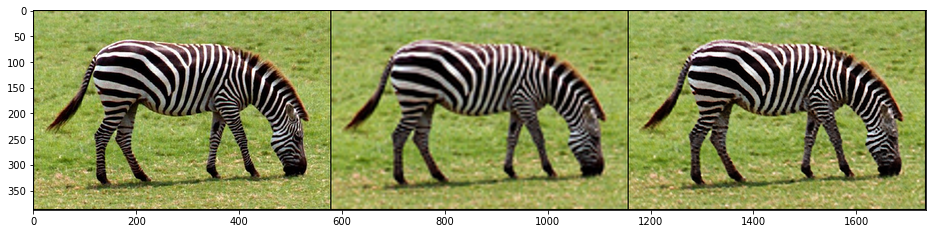

Iteration 01301    PSNR_LR 37.120   PSNR_HR 24.158Iteration 01302    PSNR_LR 36.991   PSNR_HR 24.148Iteration 01303    PSNR_LR 37.133   PSNR_HR 24.150Iteration 01304    PSNR_LR 37.169   PSNR_HR 24.176Iteration 01305    PSNR_LR 37.114   PSNR_HR 24.141Iteration 01306    PSNR_LR 37.105   PSNR_HR 24.130Iteration 01307    PSNR_LR 37.098   PSNR_HR 24.162Iteration 01308    PSNR_LR 37.355   PSNR_HR 24.147Iteration 01309    PSNR_LR 37.133   PSNR_HR 24.111Iteration 01310    PSNR_LR 37.125   PSNR_HR 24.168Iteration 01311    PSNR_LR 37.130   PSNR_HR 24.122Iteration 01312    PSNR_LR 37.065   PSNR_HR 24.162Iteration 01313    PSNR_LR 37.326   PSNR_HR 24.149Iteration 01314    PSNR_LR 37.313   PSNR_HR 24.152Iteration 01315    PSNR_LR 37.070   PSNR_HR 24.175Iteration 01316    PSNR_LR 37.389   PSNR_HR 24.155Iteration 01317    PSNR_LR 37.181   PSNR_HR 24.135Iteration 01318    PSNR_LR 37.213   PSNR_HR 24.167Iteration 01319    PSNR_LR 37.037   PSNR_HR 24.133Iteration 01320    PSNR_LR 36.857   PSNR_HR 24.160

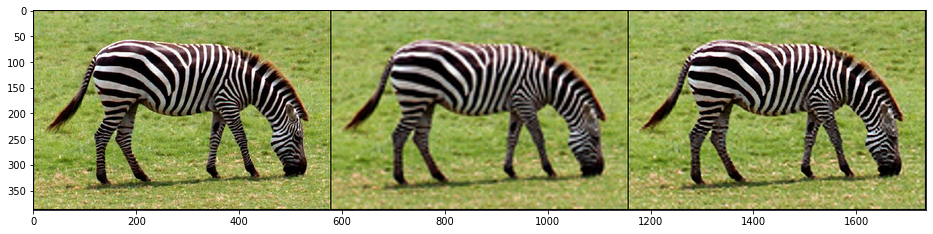

Iteration 01401    PSNR_LR 37.590   PSNR_HR 24.191Iteration 01402    PSNR_LR 37.538   PSNR_HR 24.176Iteration 01403    PSNR_LR 37.218   PSNR_HR 24.098Iteration 01404    PSNR_LR 37.374   PSNR_HR 24.188Iteration 01405    PSNR_LR 37.529   PSNR_HR 24.175Iteration 01406    PSNR_LR 37.548   PSNR_HR 24.185Iteration 01407    PSNR_LR 37.461   PSNR_HR 24.184Iteration 01408    PSNR_LR 37.523   PSNR_HR 24.164Iteration 01409    PSNR_LR 37.707   PSNR_HR 24.174Iteration 01410    PSNR_LR 37.482   PSNR_HR 24.171Iteration 01411    PSNR_LR 37.695   PSNR_HR 24.182Iteration 01412    PSNR_LR 37.664   PSNR_HR 24.189Iteration 01413    PSNR_LR 37.541   PSNR_HR 24.178Iteration 01414    PSNR_LR 37.524   PSNR_HR 24.169Iteration 01415    PSNR_LR 37.626   PSNR_HR 24.157Iteration 01416    PSNR_LR 37.752   PSNR_HR 24.161Iteration 01417    PSNR_LR 37.601   PSNR_HR 24.141Iteration 01418    PSNR_LR 37.520   PSNR_HR 24.202Iteration 01419    PSNR_LR 37.639   PSNR_HR 24.184Iteration 01420    PSNR_LR 37.573   PSNR_HR 24.150

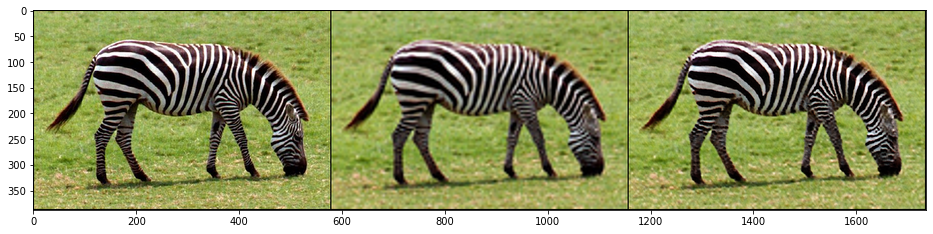

Iteration 01501    PSNR_LR 37.863   PSNR_HR 24.174Iteration 01502    PSNR_LR 37.928   PSNR_HR 24.213Iteration 01503    PSNR_LR 37.495   PSNR_HR 24.249Iteration 01504    PSNR_LR 37.598   PSNR_HR 24.210Iteration 01505    PSNR_LR 37.709   PSNR_HR 24.207Iteration 01506    PSNR_LR 37.891   PSNR_HR 24.215Iteration 01507    PSNR_LR 37.694   PSNR_HR 24.219Iteration 01508    PSNR_LR 37.513   PSNR_HR 24.184Iteration 01509    PSNR_LR 37.823   PSNR_HR 24.188Iteration 01510    PSNR_LR 37.674   PSNR_HR 24.234Iteration 01511    PSNR_LR 37.577   PSNR_HR 24.236Iteration 01512    PSNR_LR 37.724   PSNR_HR 24.210Iteration 01513    PSNR_LR 37.795   PSNR_HR 24.196Iteration 01514    PSNR_LR 37.898   PSNR_HR 24.184Iteration 01515    PSNR_LR 37.507   PSNR_HR 24.188Iteration 01516    PSNR_LR 37.737   PSNR_HR 24.202Iteration 01517    PSNR_LR 37.689   PSNR_HR 24.210Iteration 01518    PSNR_LR 37.710   PSNR_HR 24.196Iteration 01519    PSNR_LR 37.678   PSNR_HR 24.186Iteration 01520    PSNR_LR 37.533   PSNR_HR 24.170

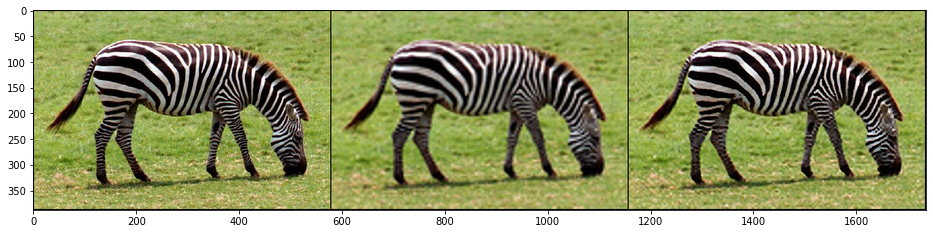

Iteration 01601    PSNR_LR 38.156   PSNR_HR 24.228Iteration 01602    PSNR_LR 37.772   PSNR_HR 24.218Iteration 01603    PSNR_LR 37.752   PSNR_HR 24.238Iteration 01604    PSNR_LR 37.868   PSNR_HR 24.165Iteration 01605    PSNR_LR 38.003   PSNR_HR 24.203Iteration 01606    PSNR_LR 37.952   PSNR_HR 24.246Iteration 01607    PSNR_LR 37.649   PSNR_HR 24.171Iteration 01608    PSNR_LR 38.026   PSNR_HR 24.234Iteration 01609    PSNR_LR 38.050   PSNR_HR 24.196Iteration 01610    PSNR_LR 38.009   PSNR_HR 24.209Iteration 01611    PSNR_LR 37.966   PSNR_HR 24.230Iteration 01612    PSNR_LR 38.033   PSNR_HR 24.230Iteration 01613    PSNR_LR 38.066   PSNR_HR 24.207Iteration 01614    PSNR_LR 38.102   PSNR_HR 24.245Iteration 01615    PSNR_LR 38.090   PSNR_HR 24.220Iteration 01616    PSNR_LR 38.038   PSNR_HR 24.262Iteration 01617    PSNR_LR 37.899   PSNR_HR 24.190Iteration 01618    PSNR_LR 38.075   PSNR_HR 24.253Iteration 01619    PSNR_LR 38.184   PSNR_HR 24.215Iteration 01620    PSNR_LR 38.113   PSNR_HR 24.199

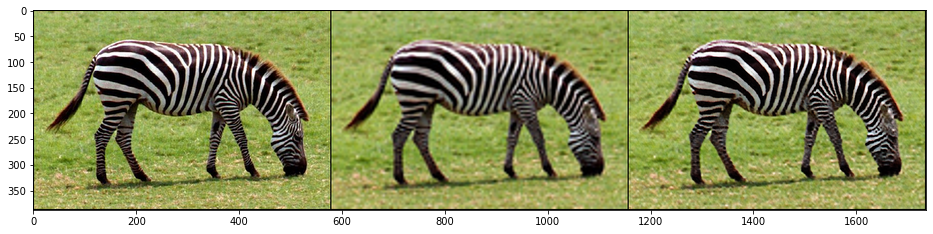

Iteration 01701    PSNR_LR 38.036   PSNR_HR 24.192Iteration 01702    PSNR_LR 38.119   PSNR_HR 24.277Iteration 01703    PSNR_LR 38.199   PSNR_HR 24.239Iteration 01704    PSNR_LR 38.185   PSNR_HR 24.264Iteration 01705    PSNR_LR 38.366   PSNR_HR 24.273Iteration 01706    PSNR_LR 38.263   PSNR_HR 24.228Iteration 01707    PSNR_LR 38.258   PSNR_HR 24.284Iteration 01708    PSNR_LR 38.350   PSNR_HR 24.251Iteration 01709    PSNR_LR 38.316   PSNR_HR 24.236Iteration 01710    PSNR_LR 38.314   PSNR_HR 24.258Iteration 01711    PSNR_LR 38.136   PSNR_HR 24.230Iteration 01712    PSNR_LR 38.455   PSNR_HR 24.256Iteration 01713    PSNR_LR 38.377   PSNR_HR 24.268Iteration 01714    PSNR_LR 38.434   PSNR_HR 24.255Iteration 01715    PSNR_LR 38.342   PSNR_HR 24.281Iteration 01716    PSNR_LR 38.189   PSNR_HR 24.200Iteration 01717    PSNR_LR 38.237   PSNR_HR 24.241Iteration 01718    PSNR_LR 38.338   PSNR_HR 24.226Iteration 01719    PSNR_LR 38.350   PSNR_HR 24.229Iteration 01720    PSNR_LR 37.897   PSNR_HR 24.272

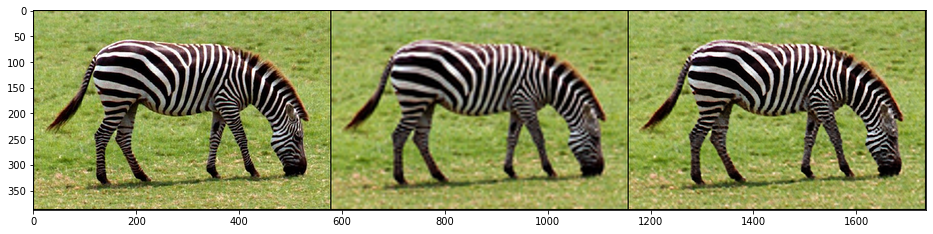

Iteration 01801    PSNR_LR 38.574   PSNR_HR 24.294Iteration 01802    PSNR_LR 38.669   PSNR_HR 24.282Iteration 01803    PSNR_LR 38.599   PSNR_HR 24.254Iteration 01804    PSNR_LR 38.624   PSNR_HR 24.265Iteration 01805    PSNR_LR 38.563   PSNR_HR 24.285Iteration 01806    PSNR_LR 38.571   PSNR_HR 24.272Iteration 01807    PSNR_LR 38.628   PSNR_HR 24.263Iteration 01808    PSNR_LR 38.418   PSNR_HR 24.268Iteration 01809    PSNR_LR 38.539   PSNR_HR 24.264Iteration 01810    PSNR_LR 38.766   PSNR_HR 24.320Iteration 01811    PSNR_LR 38.425   PSNR_HR 24.285Iteration 01812    PSNR_LR 38.360   PSNR_HR 24.274Iteration 01813    PSNR_LR 38.581   PSNR_HR 24.281Iteration 01814    PSNR_LR 38.534   PSNR_HR 24.243Iteration 01815    PSNR_LR 38.098   PSNR_HR 24.255Iteration 01816    PSNR_LR 38.190   PSNR_HR 24.241Iteration 01817    PSNR_LR 38.494   PSNR_HR 24.279Iteration 01818    PSNR_LR 38.436   PSNR_HR 24.334Iteration 01819    PSNR_LR 38.361   PSNR_HR 24.258Iteration 01820    PSNR_LR 38.378   PSNR_HR 24.286

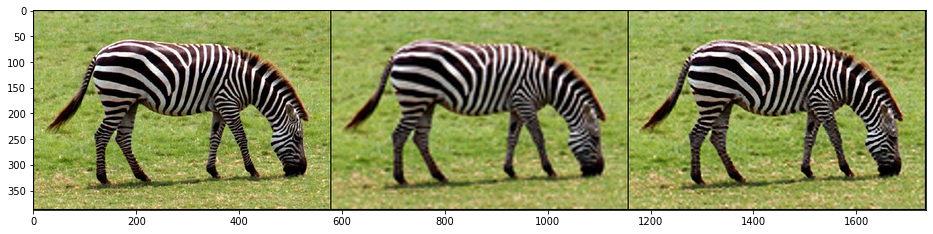

Iteration 01901    PSNR_LR 38.774   PSNR_HR 24.353Iteration 01902    PSNR_LR 38.887   PSNR_HR 24.298Iteration 01903    PSNR_LR 38.661   PSNR_HR 24.242Iteration 01904    PSNR_LR 38.574   PSNR_HR 24.298Iteration 01905    PSNR_LR 38.919   PSNR_HR 24.312Iteration 01906    PSNR_LR 38.555   PSNR_HR 24.288Iteration 01907    PSNR_LR 38.555   PSNR_HR 24.318Iteration 01908    PSNR_LR 38.775   PSNR_HR 24.294Iteration 01909    PSNR_LR 38.884   PSNR_HR 24.280Iteration 01910    PSNR_LR 38.855   PSNR_HR 24.327Iteration 01911    PSNR_LR 38.963   PSNR_HR 24.282Iteration 01912    PSNR_LR 38.638   PSNR_HR 24.272Iteration 01913    PSNR_LR 38.734   PSNR_HR 24.330Iteration 01914    PSNR_LR 38.890   PSNR_HR 24.333Iteration 01915    PSNR_LR 38.599   PSNR_HR 24.281Iteration 01916    PSNR_LR 38.853   PSNR_HR 24.316Iteration 01917    PSNR_LR 38.681   PSNR_HR 24.308Iteration 01918    PSNR_LR 38.823   PSNR_HR 24.305Iteration 01919    PSNR_LR 38.829   PSNR_HR 24.324Iteration 01920    PSNR_LR 38.731   PSNR_HR 24.297

In [10]:
psnr_history = [] 
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

i = 0
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [0]:
out_HR_np = np.clip(torch_to_np(net(net_input)), 0, 1)
result_deep_prior = put_in_center(out_HR_np, imgs['orig_np'].shape[1:])

# For the paper we acually took `_bicubic.png` files from LapSRN viewer and used `result_deep_prior` as our result
plot_image_grid([imgs['HR_np'],
                 imgs['bicubic_np'],
                 out_HR_np], factor=4, nrow=1);